In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

In [2]:
hdb = pd.read_csv('./resale-flat-prices/resale-flat-prices-based-on-registration-date-from-jan-2015-onwards.csv')

In [3]:
hdb.head()

,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price
0,2015-01,ANG MO KIO,3 ROOM,174,ANG MO KIO AVE 4,07 TO 09,60.0,Improved,1986,70,255000.0
1,2015-01,ANG MO KIO,3 ROOM,541,ANG MO KIO AVE 10,01 TO 03,68.0,New Generation,1981,65,275000.0
2,2015-01,ANG MO KIO,3 ROOM,163,ANG MO KIO AVE 4,01 TO 03,69.0,New Generation,1980,64,285000.0
3,2015-01,ANG MO KIO,3 ROOM,446,ANG MO KIO AVE 10,01 TO 03,68.0,New Generation,1979,63,290000.0
4,2015-01,ANG MO KIO,3 ROOM,557,ANG MO KIO AVE 10,07 TO 09,68.0,New Generation,1980,64,290000.0


In [4]:
hdb.tail()

,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price
79095,2018-12,YISHUN,5 ROOM,760,YISHUN ST 72,10 TO 12,122.0,Improved,1987,67,470000.0
79096,2018-12,YISHUN,5 ROOM,816,YISHUN ST 81,04 TO 06,122.0,Improved,1988,68,500000.0
79097,2018-12,YISHUN,5 ROOM,844,YISHUN ST 81,10 TO 12,127.0,Improved,1988,69,500000.0
79098,2018-12,YISHUN,EXECUTIVE,665,YISHUN AVE 4,07 TO 09,164.0,Apartment,1992,72,708000.0
79099,2018-12,YISHUN,EXECUTIVE,326,YISHUN RING RD,10 TO 12,146.0,Maisonette,1988,68,560000.0


In [5]:
hdb.describe()

,floor_area_sqm,lease_commence_date,remaining_lease,resale_price
count,79100.000000,79100.000000,79100.000000,7.910000e+04
mean,97.589028,1992.092554,74.031075,4.397935e+05
std,24.222762,11.547192,11.517000,1.456448e+05
min,31.000000,1966.000000,47.000000,1.600000e+05
25%,76.000000,1984.000000,66.000000,3.380000e+05
50%,96.000000,1992.000000,73.000000,4.088880e+05
75%,112.000000,2001.000000,83.000000,5.050000e+05
max,280.000000,2016.000000,97.000000,1.185000e+06


In [6]:
#Check for null values
hdb.isnull().sum()

month                  0
town                   0
flat_type              0
block                  0
street_name            0
storey_range           0
floor_area_sqm         0
flat_model             0
lease_commence_date    0
remaining_lease        0
resale_price           0
dtype: int64

In [7]:
import cufflinks as cf
cf.go_offline()

In [8]:
#Look at the price distribution
(hdb['resale_price']/1000).iplot(kind='hist',bins=200,
                               title='Distribution of Resale Price',
                               xTitle='Resale Price in Thousands',
                               yTitle='Count')

In [9]:
#Check the unique HDB towns
hdb['town'].unique()

array(['ANG MO KIO', 'BEDOK', 'BISHAN', 'BUKIT BATOK', 'BUKIT MERAH',
       'BUKIT PANJANG', 'BUKIT TIMAH', 'CENTRAL AREA', 'CHOA CHU KANG',
       'CLEMENTI', 'GEYLANG', 'HOUGANG', 'JURONG EAST', 'JURONG WEST',
       'KALLANG/WHAMPOA', 'MARINE PARADE', 'PASIR RIS', 'PUNGGOL',
       'QUEENSTOWN', 'SEMBAWANG', 'SENGKANG', 'SERANGOON', 'TAMPINES',
       'TOA PAYOH', 'WOODLANDS', 'YISHUN'], dtype=object)

Text(0, 0.5, 'Resale Price (Thousands)')

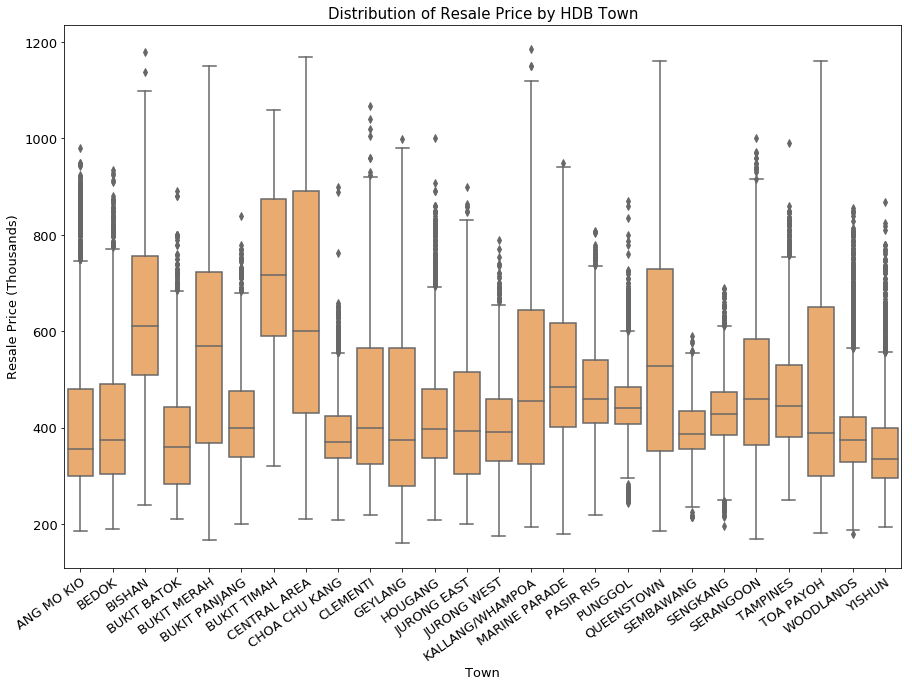

In [10]:
#Take a look at the price distribution across towns
plt.figure(figsize=(15,10))
sns.boxplot(x='town',y=hdb['resale_price']/1000, data=hdb, color='#fdab5b')

plt.title('Distribution of Resale Price by HDB Town', fontsize=15)
plt.xticks(rotation=35, ha='right', rotation_mode='anchor', fontsize=13)
plt.yticks(fontsize=13)
plt.xlabel('Town', fontsize=13)
plt.ylabel('Resale Price (Thousands)', fontsize=13)

In [11]:
hdb['flat_type'].value_counts()

4 ROOM              32476
3 ROOM              20187
5 ROOM              19189
EXECUTIVE            6337
2 ROOM                855
1 ROOM                 32
MULTI-GENERATION       24
Name: flat_type, dtype: int64

Text(0, 0.5, 'Resale Price (Thousands)')

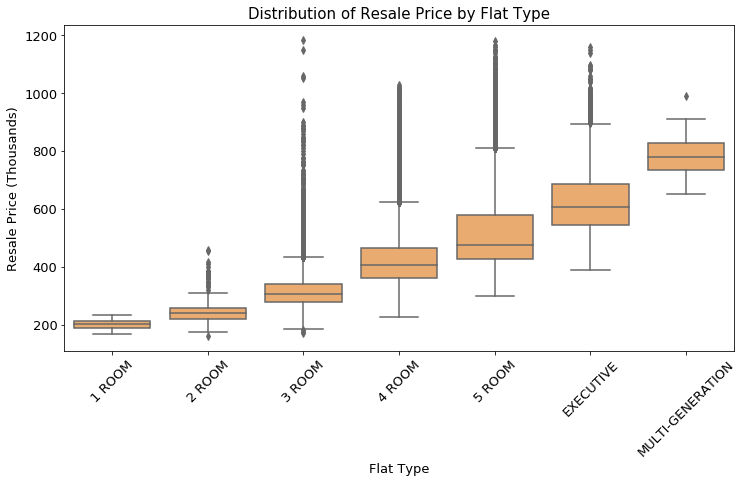

In [12]:
#Take a look at the price distribution across different flat types
order = ['1 ROOM', '2 ROOM', '3 ROOM', '4 ROOM',  '5 ROOM', 'EXECUTIVE', 'MULTI-GENERATION']

plt.figure(figsize=(12,6))
sns.boxplot(x='flat_type',y=hdb['resale_price']/1000, data=hdb, order=order, color = '#fdab5b')

plt.title('Distribution of Resale Price by Flat Type', fontsize=15)
plt.xticks(rotation=45, fontsize=13)
plt.yticks(fontsize=13)
plt.xlabel('Flat Type', fontsize=13)
plt.ylabel('Resale Price (Thousands)', fontsize=13)

In [13]:
hdb['flat_model'].value_counts()

Model A                   24184
Improved                  20017
New Generation            12325
Premium Apartment          8250
Simplified                 3692
Apartment                  3231
Standard                   2337
Maisonette                 2283
Model A2                   1208
DBSS                        831
Type S1                     217
Model A-Maisonette          134
Adjoined flat               123
Type S2                     102
Premium Apartment.           65
Terrace                      48
Multi Generation             24
Improved-Maisonette          15
Premium Apartment Loft        8
Premium Maisonette            5
2-room                        1
Name: flat_model, dtype: int64

In [14]:
#2-room sounds more like it should be under flat_type, especially since it occurs only once.
hdb[hdb['flat_model']=='2-room']

,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price
33455,2016-10,PASIR RIS,2 ROOM,142,PASIR RIS ST 11,01 TO 03,55.0,2-room,1994,76,240000.0


In [15]:
#take a look at the other kinds of models in the same flat
hdb[(hdb['street_name']=='PASIR RIS ST 11') & (hdb['block']=='142')]

,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price
14145,2015-10,PASIR RIS,4 ROOM,142,PASIR RIS ST 11,01 TO 03,108.0,Model A,1994,77,388000.0
15732,2015-11,PASIR RIS,5 ROOM,142,PASIR RIS ST 11,04 TO 06,128.0,Improved,1994,77,445000.0
17162,2015-12,PASIR RIS,5 ROOM,142,PASIR RIS ST 11,07 TO 09,128.0,Improved,1994,77,395000.0
22891,2016-04,PASIR RIS,4 ROOM,142,PASIR RIS ST 11,10 TO 12,110.0,Model A,1994,77,388000.0
24747,2016-05,PASIR RIS,4 ROOM,142,PASIR RIS ST 11,04 TO 06,108.0,Model A,1994,76,365000.0
24762,2016-05,PASIR RIS,4 ROOM,142,PASIR RIS ST 11,04 TO 06,108.0,Model A,1994,76,409000.0
30028,2016-08,PASIR RIS,4 ROOM,142,PASIR RIS ST 11,04 TO 06,108.0,Model A,1994,76,380000.0
33455,2016-10,PASIR RIS,2 ROOM,142,PASIR RIS ST 11,01 TO 03,55.0,2-room,1994,76,240000.0
40373,2017-03,PASIR RIS,4 ROOM,142,PASIR RIS ST 11,07 TO 09,108.0,Model A,1994,76,370000.0
44181,2017-05,PASIR RIS,5 ROOM,142,PASIR RIS ST 11,04 TO 06,128.0,Improved,1994,75,425000.0


In [16]:
hdb[(hdb['flat_type']=='2 ROOM')]['flat_model'].value_counts()

Standard             296
Model A              284
Improved             256
Premium Apartment     18
2-room                 1
Name: flat_model, dtype: int64

<div class="alert alert-block alert-warning">
    To get more insight on whether this is an error, I'll look for instances of 2-room in older records.
</div>

In [17]:
hdb2012 = pd.read_csv('./resale-flat-prices/resale-flat-prices-based-on-registration-date-from-mar-2012-to-dec-2014.csv')

In [18]:
hdb2012['flat_model'].value_counts()

Model A                14430
Improved               13744
New Generation          9598
Premium Apartment       4514
Simplified              3092
Apartment               2150
Standard                2144
Maisonette              1443
Model A2                 792
Adjoined flat             84
Model A-Maisonette        75
DBSS                      72
Terrace                   33
Multi Generation          21
Improved-Maisonette        6
Premium Maisonette         4
Type S1                    1
Name: flat_model, dtype: int64

In [19]:
hdb2000 = pd.read_csv('./resale-flat-prices/resale-flat-prices-based-on-approval-date-2000-feb-2012.csv')

In [20]:
hdb2000['flat_model'].value_counts()

Model A                106147
Improved               100439
New Generation          71685
Simplified              22370
Premium Apartment       18300
Standard                16894
Apartment               15274
Maisonette               9839
Model A2                 6696
Adjoined flat             801
Model A-Maisonette        626
Terrace                   292
Multi Generation          160
Premium Maisonette         66
Improved-Maisonette        46
2-room                     16
Name: flat_model, dtype: int64

In [21]:
hdb2000[hdb2000['flat_model']=='2-room']

,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,resale_price
24203,2000-09,PASIR RIS,2 ROOM,142,PASIR RIS ST 11,01 TO 03,55.0,2-room,1994,135000.0
96440,2002-08,PASIR RIS,2 ROOM,142,PASIR RIS ST 11,01 TO 03,55.0,2-room,1994,136000.0
107925,2002-12,PASIR RIS,2 ROOM,142,PASIR RIS ST 11,01 TO 03,55.0,2-room,1994,140000.0
117119,2003-04,PASIR RIS,2 ROOM,142,PASIR RIS ST 11,01 TO 03,55.0,2-room,1994,152000.0
133832,2003-11,PASIR RIS,2 ROOM,142,PASIR RIS ST 11,01 TO 03,58.0,2-room,1994,135000.0
161149,2004-10,PASIR RIS,2 ROOM,142,PASIR RIS ST 11,01 TO 03,55.0,2-room,1994,148000.0
173947,2005-03,PASIR RIS,2 ROOM,142,PASIR RIS ST 11,01 TO 03,55.0,2-room,1994,150000.0
250709,2007-12,PASIR RIS,2 ROOM,142,PASIR RIS ST 11,01 TO 03,55.0,2-room,1994,188000.0
275751,2008-11,PASIR RIS,2 ROOM,142,PASIR RIS ST 11,01 TO 03,55.0,2-room,1994,208000.0
281903,2009-02,PASIR RIS,2 ROOM,142,PASIR RIS ST 11,01 TO 03,58.0,2-room,1994,190000.0


In [22]:
hdb1990 = pd.read_csv('./resale-flat-prices/resale-flat-prices-based-on-approval-date-1990-1999.csv')

In [23]:
hdb1990['flat_model'].value_counts()

NEW GENERATION         78898
IMPROVED               73593
MODEL A                70381
SIMPLIFIED             23258
STANDARD               17375
MAISONETTE             12215
APARTMENT               9901
MODEL A-MAISONETTE       982
ADJOINED FLAT            944
MULTI GENERATION         279
TERRACE                  247
IMPROVED-MAISONETTE       44
2-ROOM                    21
PREMIUM APARTMENT          6
Name: flat_model, dtype: int64

In [24]:
hdb1990[hdb1990['flat_model']=='2-ROOM']

,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,resale_price
2342,1990-02,TOA PAYOH,2 ROOM,120,LOR 2 TOA PAYOH,04 TO 06,40.0,2-ROOM,1968,17000
7299,1990-07,QUEENSTOWN,2 ROOM,66,C'WEALTH DR,04 TO 06,42.0,2-ROOM,1969,14000
9392,1990-09,QUEENSTOWN,2 ROOM,29,TANGLIN HALT RD,01 TO 03,42.0,2-ROOM,1970,17000
13515,1991-01,QUEENSTOWN,2 ROOM,81,C'WEALTH CL,04 TO 06,46.0,2-ROOM,1967,18900
37074,1992-10,QUEENSTOWN,2 ROOM,29,TANGLIN HALT RD,01 TO 03,42.0,2-ROOM,1970,16000
51042,1993-09,QUEENSTOWN,2 ROOM,66,C'WEALTH DR,04 TO 06,42.0,2-ROOM,1969,42500
93605,1995-06,ANG MO KIO,2 ROOM,174,ANG MO KIO AVE 4,10 TO 12,45.0,2-ROOM,1986,66000
94355,1995-06,GEYLANG,2 ROOM,44,CIRCUIT RD,07 TO 09,40.0,2-ROOM,1971,55000
122464,1996-04,QUEENSTOWN,2 ROOM,66,C'WEALTH DR,04 TO 06,42.0,2-ROOM,1969,76000
137140,1996-09,QUEENSTOWN,2 ROOM,65,C'WEALTH DR,01 TO 03,42.0,2-ROOM,1969,100000


<div class="alert alert-block alert-danger">
    'Premium Apartment.' should be merged into 'Premium Apartment' as they should mean the same flat model.  
    <br>
    '2-room' seemed to be an error at first but it appears to be a discontinued model type that existed from early records.
</div>

In [25]:
#Correct the typo for 'Premium Apartment.'
hdb['flat_model'] = [name[:-1] if name == 'Premium Apartment.' else name for name in hdb['flat_model']]

In [26]:
hdb['flat_model'].value_counts()

Model A                   24184
Improved                  20017
New Generation            12325
Premium Apartment          8315
Simplified                 3692
Apartment                  3231
Standard                   2337
Maisonette                 2283
Model A2                   1208
DBSS                        831
Type S1                     217
Model A-Maisonette          134
Adjoined flat               123
Type S2                     102
Terrace                      48
Multi Generation             24
Improved-Maisonette          15
Premium Apartment Loft        8
Premium Maisonette            5
2-room                        1
Name: flat_model, dtype: int64

Text(0, 0.5, 'Resale Price (Thousands)')

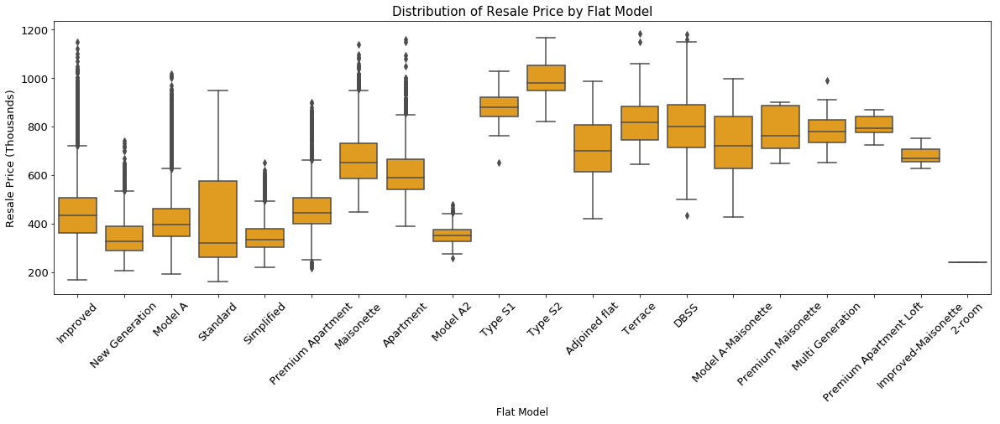

In [27]:
#Take a look at the price distribution across different flat models
plt.figure(figsize=(20,6))
sns.boxplot(x='flat_model',y=hdb['resale_price']/1000, data=hdb, color = 'orange')

plt.title('Distribution of Resale Price by Flat Model', fontsize=15)
plt.xticks(rotation=45, fontsize=13)
plt.yticks(fontsize=13)
plt.xlabel('Flat Model', fontsize=12)
plt.ylabel('Resale Price (Thousands)', fontsize=13)

Text(0, 0.5, 'Resale Price (Thousands)')

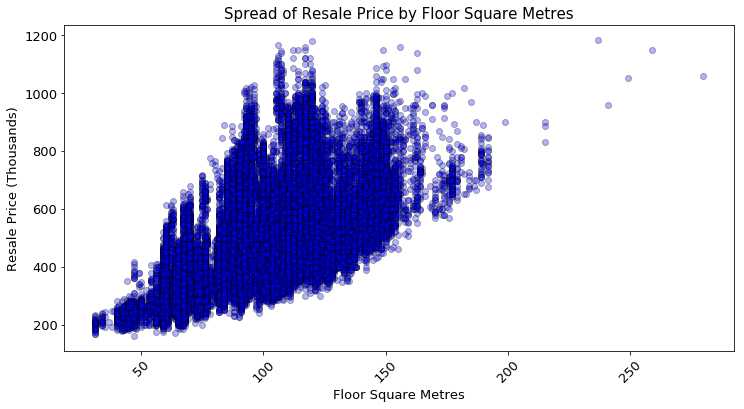

In [28]:
#Take a look at the price distribution across different floor area
plt.figure(figsize=(12,6))
plt.scatter(hdb['floor_area_sqm'],hdb['resale_price']/1000, c='blue', edgecolors='k', alpha = 0.3)
plt.title('Spread of Resale Price by Floor Square Metres', fontsize=15)

plt.xticks(rotation=45, fontsize=13)
plt.yticks(fontsize=13)
plt.xlabel('Floor Square Metres', fontsize=13)
plt.ylabel('Resale Price (Thousands)', fontsize=13)

Text(0, 0.5, 'Resale Price (Thousands)')

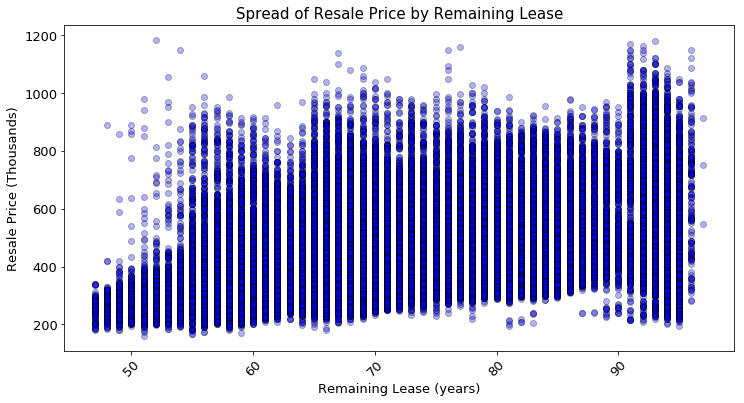

In [29]:
#Take a look at the price distribution across different remaining years of lease
plt.figure(figsize=(12,6))
plt.scatter(hdb['remaining_lease'],hdb['resale_price']/1000, c='blue', edgecolors='k', alpha = 0.3)
plt.title('Spread of Resale Price by Remaining Lease', fontsize=15)

plt.xticks(rotation=45, fontsize=13)
plt.yticks(fontsize=13)
plt.xlabel('Remaining Lease (years)', fontsize=13)
plt.ylabel('Resale Price (Thousands)', fontsize=13)

Text(0, 0.5, 'Resale Price (Thousands)')

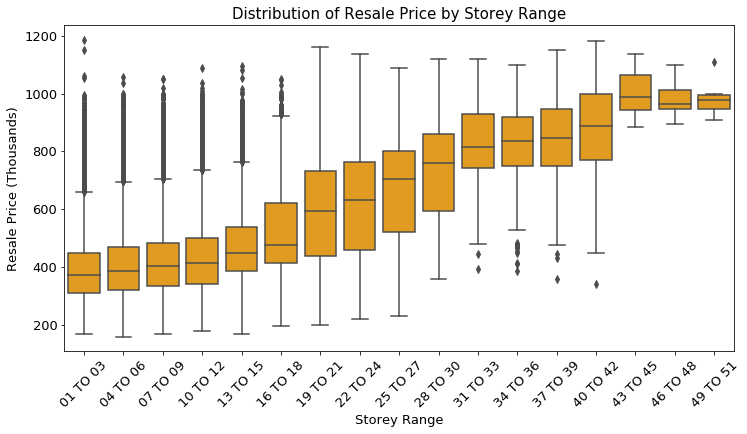

In [30]:
#Take a look at the price distribution across different storeys
storey_order = np.sort(hdb['storey_range'].unique())
plt.figure(figsize=(12,6))
sns.boxplot(x='storey_range',y=hdb['resale_price']/1000, data=hdb, order= storey_order, color='orange')

plt.title('Distribution of Resale Price by Storey Range', fontsize=15)
plt.xticks(rotation=45, fontsize=13)
plt.yticks(fontsize=13)
plt.xlabel('Storey Range', fontsize=13)
plt.ylabel('Resale Price (Thousands)', fontsize=13)

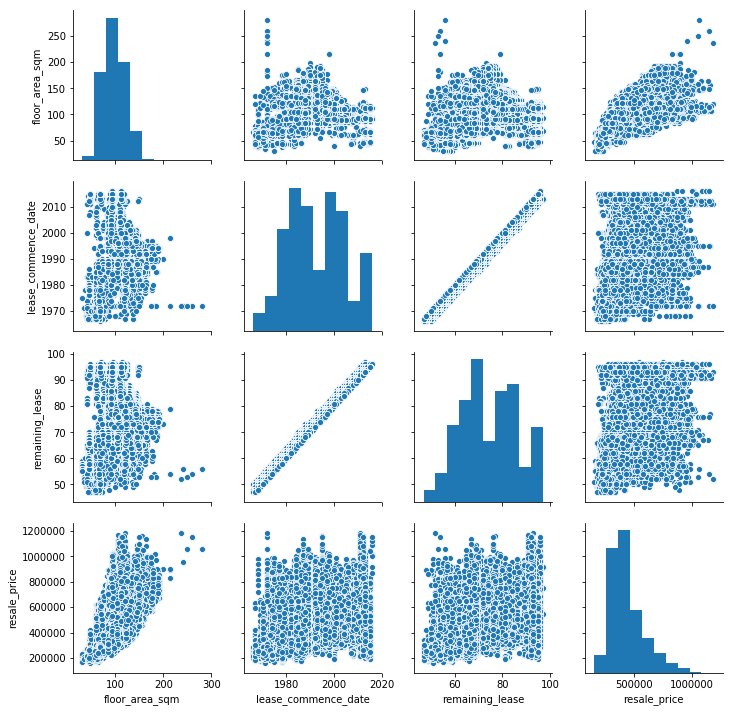

In [31]:
sns.pairplot(hdb)

(array([0.5, 1.5, 2.5, 3.5]), <a list of 4 Text xticklabel objects>)

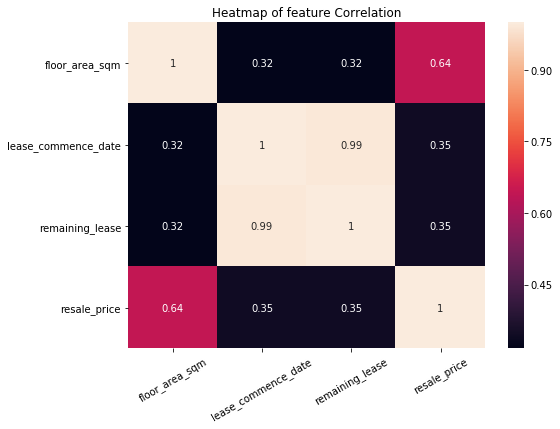

In [32]:
#Check the correlation between features

plt.figure(figsize=(8,6))
sns.heatmap(hdb.corr(),annot=True)

plt.title('Heatmap of feature Correlation')
plt.xticks(rotation=30)

In [33]:
test_df = hdb.copy()

In [34]:
#Drop features that would be well-explained by other features
test_df.drop(['block','street_name','lease_commence_date','flat_type'],axis=1,inplace=True)

In [35]:
test_df.head()

,month,town,storey_range,floor_area_sqm,flat_model,remaining_lease,resale_price
0,2015-01,ANG MO KIO,07 TO 09,60.0,Improved,70,255000.0
1,2015-01,ANG MO KIO,01 TO 03,68.0,New Generation,65,275000.0
2,2015-01,ANG MO KIO,01 TO 03,69.0,New Generation,64,285000.0
3,2015-01,ANG MO KIO,01 TO 03,68.0,New Generation,63,290000.0
4,2015-01,ANG MO KIO,07 TO 09,68.0,New Generation,64,290000.0


In [36]:
test_df.dtypes

month               object
town                object
storey_range        object
floor_area_sqm     float64
flat_model          object
remaining_lease      int64
resale_price       float64
dtype: object

In [37]:
#Convert categorical variables via hot-one encoding
dummies = pd.get_dummies(test_df[['town','storey_range','flat_model']])

In [38]:
dummies.head()

,town_ANG MO KIO,town_BEDOK,town_BISHAN,town_BUKIT BATOK,town_BUKIT MERAH,town_BUKIT PANJANG,town_BUKIT TIMAH,town_CENTRAL AREA,town_CHOA CHU KANG,town_CLEMENTI,...,flat_model_Multi Generation,flat_model_New Generation,flat_model_Premium Apartment,flat_model_Premium Apartment Loft,flat_model_Premium Maisonette,flat_model_Simplified,flat_model_Standard,flat_model_Terrace,flat_model_Type S1,flat_model_Type S2
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0


In [39]:
#Drop one instance from each category to avoid dummy variable trap
dummies.drop(['town_BUKIT BATOK','storey_range_01 TO 03','flat_model_2-room'],axis=1,inplace=True)

In [40]:
#Drop the original categorical columns
test_df.drop(['town','storey_range','flat_model'],axis=1,inplace=True)

In [41]:
#Concatenate the hot-one encoded columns
simple_df = pd.concat([test_df,dummies],axis=1)

In [42]:
#Check the new DataFrame
simple_df.head()

,month,floor_area_sqm,remaining_lease,resale_price,town_ANG MO KIO,town_BEDOK,town_BISHAN,town_BUKIT MERAH,town_BUKIT PANJANG,town_BUKIT TIMAH,...,flat_model_Multi Generation,flat_model_New Generation,flat_model_Premium Apartment,flat_model_Premium Apartment Loft,flat_model_Premium Maisonette,flat_model_Simplified,flat_model_Standard,flat_model_Terrace,flat_model_Type S1,flat_model_Type S2
0,2015-01,60.0,70,255000.0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2015-01,68.0,65,275000.0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
2,2015-01,69.0,64,285000.0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
3,2015-01,68.0,63,290000.0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
4,2015-01,68.0,64,290000.0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0


## Modelling 

In [43]:
#Split data for training and testing
X_train = simple_df[~simple_df['month'].str.contains('2018')].drop(['resale_price','month'],axis=1).copy()
y_train = simple_df[~simple_df['month'].str.contains('2018')]['resale_price'].copy()
X_test = simple_df[simple_df['month'].str.contains('2018')].drop(['resale_price','month'],axis=1).copy()
y_test = simple_df[simple_df['month'].str.contains('2018')]['resale_price'].copy()

In [44]:
#Check the shapes of train and test data
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(57505, 62)
(57505,)
(21595, 62)
(21595,)


In [45]:
X_train.columns

Index(['floor_area_sqm', 'remaining_lease', 'town_ANG MO KIO', 'town_BEDOK',
       'town_BISHAN', 'town_BUKIT MERAH', 'town_BUKIT PANJANG',
       'town_BUKIT TIMAH', 'town_CENTRAL AREA', 'town_CHOA CHU KANG',
       'town_CLEMENTI', 'town_GEYLANG', 'town_HOUGANG', 'town_JURONG EAST',
       'town_JURONG WEST', 'town_KALLANG/WHAMPOA', 'town_MARINE PARADE',
       'town_PASIR RIS', 'town_PUNGGOL', 'town_QUEENSTOWN', 'town_SEMBAWANG',
       'town_SENGKANG', 'town_SERANGOON', 'town_TAMPINES', 'town_TOA PAYOH',
       'town_WOODLANDS', 'town_YISHUN', 'storey_range_04 TO 06',
       'storey_range_07 TO 09', 'storey_range_10 TO 12',
       'storey_range_13 TO 15', 'storey_range_16 TO 18',
       'storey_range_19 TO 21', 'storey_range_22 TO 24',
       'storey_range_25 TO 27', 'storey_range_28 TO 30',
       'storey_range_31 TO 33', 'storey_range_34 TO 36',
       'storey_range_37 TO 39', 'storey_range_40 TO 42',
       'storey_range_43 TO 45', 'storey_range_46 TO 48',
       'storey_range_

In [46]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Lasso, LassoCV, Ridge, RidgeCV, ElasticNet, ElasticNetCV
from sklearn.metrics import r2_score,mean_absolute_error, mean_squared_error
from sklearn.model_selection import cross_val_score,cross_validate
import statsmodels.api as sm

In [47]:
#Scale the data
ss = StandardScaler()
Xs_train = ss.fit_transform(X_train)
Xs_test = ss.transform(X_test)

C:\Users\kwanw\Anaconda3\envs\Env2\lib\site-packages\sklearn\preprocessing\data.py:625: DataConversionWarning:

Data with input dtype uint8, int64, float64 were all converted to float64 by StandardScaler.

C:\Users\kwanw\Anaconda3\envs\Env2\lib\site-packages\sklearn\base.py:462: DataConversionWarning:

Data with input dtype uint8, int64, float64 were all converted to float64 by StandardScaler.

C:\Users\kwanw\Anaconda3\envs\Env2\lib\site-packages\ipykernel_launcher.py:4: DataConversionWarning:

Data with input dtype uint8, int64, float64 were all converted to float64 by StandardScaler.



## Statsmodel

In [48]:
X_sm = sm.add_constant(Xs_train) 

In [49]:
model = sm.OLS(y_train,X_sm)
results = model.fit()

In [50]:
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           resale_price   R-squared:                       0.864
Model:                            OLS   Adj. R-squared:                  0.864
Method:                 Least Squares   F-statistic:                     5893.
Date:                Mon, 04 Mar 2019   Prob (F-statistic):               0.00
Time:                        19:05:22   Log-Likelihood:            -7.0598e+05
No. Observations:               57505   AIC:                         1.412e+06
Df Residuals:                   57442   BIC:                         1.413e+06
Df Model:                          62                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       4.393e+05    216.719   2026.953      0.000    4.39e+05     4.4e+05
x1          9.483e+04    330.402    287.001      0.000    9.42e+04    9.55e+04
x2          4.559e+04    376.201    121.191      0.000    4.49e+04    4.63e+04
x3          1.663e+04    327.526     50.783      0.000     1.6e+04    1.73e+04
x4          1.459e+04    342.891     42.537      0.000    1.39e+04    1.53e+04
x5          2.293e+04    266.570     86.001      0.000    2.24e+04    2.34e+04
x6          3.341e+04    306.649    108.959      0.000    3.28e+04     3.4e+04
x7         -1.032e+04    301.814    -34.191      0.000   -1.09e+04   -9727.746
x8          1.316e+04    224.244     58.704      0.000    1.27e+04    1.36e+04
x9          1.812e+04    313.009     57.900      0.000    1.75e+04    1.87e+04
x10        -1.895e+04    317.446    -59.697      0.000   -1.96e+04   -1.83e+04
x11          1.73e+04    277.430     62.358      0.000    1.68e+04    1.78e+04
x12         1.642e+04    288.243     56.977      0.000    1.59e+04     1.7e+04
x13         -375.1458    321.175     -1.168      0.243   -1004.650     254.358
x14         3282.1371    270.334     12.141      0.000    2752.281    3811.994
x15        -1.036e+04    368.571    -28.106      0.000   -1.11e+04   -9636.715
x16         2.155e+04    295.562     72.910      0.000     2.1e+04    2.21e+04
x17         1.759e+04    237.048     74.225      0.000    1.71e+04    1.81e+04
x18        -7377.5707    294.305    -25.068      0.000   -7954.411   -6800.731
x19        -9978.5700    352.832    -28.281      0.000   -1.07e+04   -9287.018
x20         2.953e+04    287.040    102.867      0.000     2.9e+04    3.01e+04
x21        -1.521e+04    288.150    -52.791      0.000   -1.58e+04   -1.46e+04
x22        -1.392e+04    379.458    -36.685      0.000   -1.47e+04   -1.32e+04
x23          1.01e+04    268.935     37.571      0.000    9576.895    1.06e+04
x24         5889.6516    354.096     16.633      0.000    5195.622    6583.681
x25          2.07e+04    298.281     69.393      0.000    2.01e+04    2.13e+04
x26        -1.972e+04    361.723    -54.506      0.000   -2.04e+04    -1.9e+04
x27        -4866.6740    336.218    -14.475      0.000   -5525.663   -4207.685
x28         6845.2285    286.841     23.864      0.000    6283.018    7407.439
x29         1.137e+04    284.659     39.956      0.000    1.08e+04    1.19e+04
x30         1.387e+04    279.673     49.608      0.000    1.33e+04    1.44e+04
x31         1.352e+04    260.067     52.001      0.000     1.3e+04     1.4e+04
x32         1.238e+04    239.683     51.632      0.000    1.19e+04    1.28e+04
x33          1.23e+04    228.880     53.730      0.000    1.18e+04    1.27e+04
x34         1.211e+04    227.143     53.320      0.000    1.17e+04    1.26e+04
x35         9381.0430    224.625     41.763      0.000    8940.777    9821.309
x3

## Simple Linear Regression

In [51]:
lr=LinearRegression()

In [52]:
def model_scores_cv(estimator,X,y):
    """
    This function takes a model with the independent and target variables and returns a list of 
    the cross validated mean r2 score and standard deviation as well as the mean RMSE and standard deviation.
    """
    scores = cross_validate(estimator,X,y,n_jobs=-1,cv=10,scoring =['r2','neg_mean_squared_error'])
    
    mean_r2_score = round(scores['test_r2'].mean(),4)
    std_r2 = round(scores['test_r2'].std(),4)
    
    print("Mean r2 score: ", mean_r2_score, '±', std_r2)
    
    mean_rmse_score = round(np.sqrt(scores['test_neg_mean_squared_error']*(-1)).mean(),4)
    rmse_std = round(np.sqrt(scores['test_neg_mean_squared_error']*(-1)).std(),4)
    
    print("Mean RMSE score: ", mean_rmse_score, '±', rmse_std)
    
    return [mean_r2_score, std_r2, mean_rmse_score, rmse_std]

In [53]:
lr_scores = model_scores_cv(lr,X_train,y_train)

Mean r2 score:  0.8629 ± 0.0034
Mean RMSE score:  52060.0828 ± 2222.5753


In [54]:
def model_test_scores(model,X_trn,y_trn,X_tst,y_tst,cols):
    """
    This function takes a model, the train and test variables and targets as well as the variable column names,
    returning the dataframe of variables and their coefficients, the r2, RMSE and predicted values
    """
    #fit the training data
    final_model = model.fit(X_trn,y_trn)
    #Predict the test data
    predictions = model.predict(X_tst)
    
    #Score the predictions
    score = r2_score(y_tst,predictions)
    rmse = round(np.sqrt(mean_squared_error(y_tst,predictions)),2)
    
    #Print the results
    print('Test r2 score: ', score)
    print('Test Mean Squared Error: ', rmse)
    
    #Creating DataFrame of Variables and their coefficients
    coef_summary = pd.DataFrame({'Features':cols,'coef':model.coef_,'abs coef':abs(model.coef_)})
    
    return coef_summary, score, rmse, predictions

In [55]:
lr_summary, lr_score, lr_rmse, lr_predictions = model_test_scores(lr,X_train,y_train,X_test,y_test,X_train.columns)

Test r2 score:  0.859177847724161
Test Mean Squared Error:  59115.64


In [56]:
comparison_df = pd.DataFrame({'model_name':[],'train_r2_mean':[],'train_r2_std':[],'train_RMSE_mean':[],'train_RMSE_std':[]})
def add_model_train(name,results_list):
    """
    This function takes in a name and a list of scores for summary comparison (training set)
    """
    global comparison_df
    #Append the name of the model and list of scores to the DataFrame
    comparison_df = comparison_df.append(pd.Series(([name]+results_list),
                               index=['model_name','train_r2_mean','train_r2_std','train_RMSE_mean','train_RMSE_std']),
                     ignore_index=True)
    
    return comparison_df

In [57]:
add_model_train('Simple Linear Regression',lr_scores)

,model_name,train_r2_mean,train_r2_std,train_RMSE_mean,train_RMSE_std
0,Simple Linear Regression,0.8629,0.0034,52060.0828,2222.5753


In [58]:
comparison_test = pd.DataFrame({'model_name':[],'test_r2_mean':[],'test_RMSE_mean':[]})
def add_model_test(name,r2,RMSE):
    """
    This function takes in a name and a list of scores for summary comparison
    """
    global comparison_test
    comparison_test = comparison_test.append(pd.Series([name,r2,RMSE],
                               index=['model_name','test_r2_mean','test_RMSE_mean']),
                     ignore_index=True)
    return comparison_test

In [59]:
add_model_test('Simple Linear Regression',lr_score, lr_rmse)

,model_name,test_r2_mean,test_RMSE_mean
0,Simple Linear Regression,0.859178,59115.64


In [60]:
#y_test stats in thousand dollars
(simple_df[simple_df['month'].str.contains('2018')]['resale_price']/1000).describe()

count    21595.000000
mean       441.161661
std        157.534954
min        160.000000
25%        328.000000
50%        408.000000
75%        515.000000
max       1185.000000
Name: resale_price, dtype: float64

In [61]:
def pred_real_plots_res(y_true,y_pred,model_name):
    '''
    This function takes in the true target values, predicted target values and model name to plot 
    the predicted versus real target values as well as the distribution of residuals
    '''
    plt.figure(figsize = (12,6))
    
    #Plot the predicted versus real target values
    plt.subplot(1,2,1)
    plt.scatter(x=y_true/1000,y=y_pred/1000,c='blue',alpha=0.3,edgecolors='k')
    #Add a horizontal line for reference
    plt.plot((min(np.append(y_true,y_pred)/1000),max(np.append(y_true,y_pred))/1000),
            ((min(np.append(y_true,y_pred)/1000),max(np.append(y_true,y_pred))/1000)),c='k')
    
    plt.xlim=plt.ylim
    plt.title('{} Model \nPredicted resale price against actual resale price'.format(model_name),fontsize=13)
    plt.xlabel('Actual Price (in thousands)',fontsize=13)
    plt.ylabel('Predicted Price (in thousands)',fontsize=13)
    
    #Plot hte distribution of residuals
    plt.subplot(1,2,2)
    plt.hist((y_true-y_pred)/1000,bins=100,edgecolor='k',color='blue')
    
    plt.title('{} Model \nDistribution of Residuals'.format(model_name),fontsize=13)
    plt.xlabel('Residuals (in thousands)',fontsize=13)
    plt.ylabel('Count',fontsize=13)
    plt.grid()

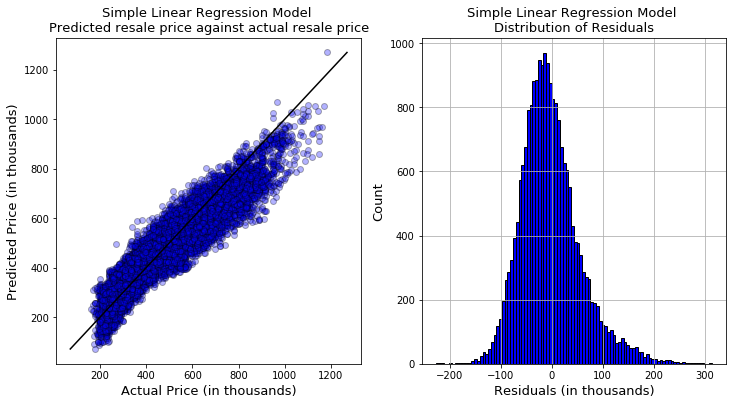

In [62]:
#Check predictions and residuals
pred_real_plots_res(y_test,lr_predictions,'Simple Linear Regression')

In [63]:
#Check the coefficients
lr_summary.sort_values('abs coef',ascending=False).head(10)

,Features,coef,abs coef
7,town_BUKIT TIMAH,262485.293132,262485.293132
59,flat_model_Terrace,246864.203316,246864.203316
16,town_MARINE PARADE,228172.068800,228172.068800
42,storey_range_49 TO 51,193910.009960,193910.009960
40,storey_range_43 TO 45,185718.133858,185718.133858
19,town_QUEENSTOWN,185432.587241,185432.587241
41,storey_range_46 TO 48,180435.053731,180435.053731
8,town_CENTRAL AREA,180149.074970,180149.074970
39,storey_range_40 TO 42,174817.238951,174817.238951
5,town_BUKIT MERAH,174684.197623,174684.197623


## Lasso

In [64]:
#Run cross validation on training set
lasso=Lasso()
lasso_scores = model_scores_cv(lasso,Xs_train,y_train)

Mean r2 score:  0.8629 ± 0.0034
Mean RMSE score:  52060.2227 ± 2223.1655


In [65]:
#Run the model on the test set
lasso_summary, lasso_score, lasso_rmse, lasso_predictions = model_test_scores(lasso,Xs_train,y_train,Xs_test,y_test,X_train.columns)

Test r2 score:  0.8591717699947174
Test Mean Squared Error:  59116.91


C:\Users\kwanw\Anaconda3\envs\Env2\lib\site-packages\sklearn\linear_model\coordinate_descent.py:492: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.



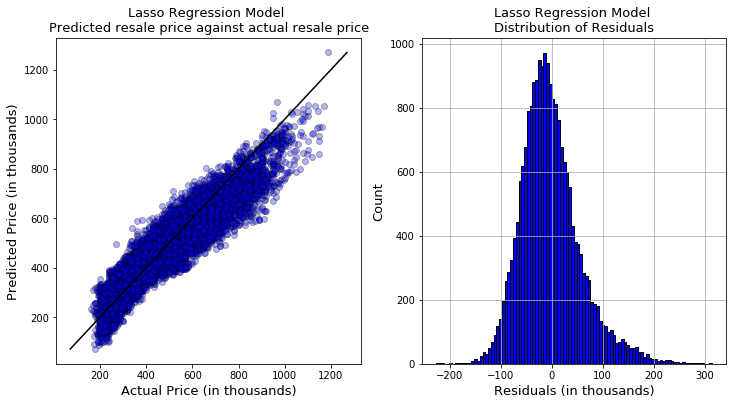

In [66]:
#Check predictions and residuals
pred_real_plots_res(y_test,lasso_predictions,'Lasso Regression')

In [67]:
#Check the coefficients
lasso_summary.sort_values('abs coef',ascending=False).head(10)

,Features,coef,abs coef
0,floor_area_sqm,94821.641867,94821.641867
1,remaining_lease,45588.723543,45588.723543
5,town_BUKIT MERAH,33410.255835,33410.255835
19,town_QUEENSTOWN,29524.910469,29524.910469
4,town_BISHAN,22924.042092,22924.042092
15,town_KALLANG/WHAMPOA,21547.397222,21547.397222
24,town_TOA PAYOH,20696.208315,20696.208315
25,town_WOODLANDS,-19715.788140,19715.788140
9,town_CHOA CHU KANG,-18949.669643,18949.669643
8,town_CENTRAL AREA,18122.137554,18122.137554


In [68]:
#Add training scores for comparison
add_model_train('Lasso Regression',lasso_scores)

,model_name,train_r2_mean,train_r2_std,train_RMSE_mean,train_RMSE_std
0,Simple Linear Regression,0.8629,0.0034,52060.0828,2222.5753
1,Lasso Regression,0.8629,0.0034,52060.2227,2223.1655


In [69]:
#Add test scores for comparison
add_model_test('Lasso Regression',lasso_score, lasso_rmse)

,model_name,test_r2_mean,test_RMSE_mean
0,Simple Linear Regression,0.859178,59115.64
1,Lasso Regression,0.859172,59116.91


## Tuned Lasso

In [70]:
#Search for optimal parameters
lasso_alpha = LassoCV(n_alphas=300, cv=10)
lasso_alpha.fit(Xs_train,y_train)

LassoCV(alphas=None, copy_X=True, cv=10, eps=0.001, fit_intercept=True,
    max_iter=1000, n_alphas=300, n_jobs=None, normalize=False,
    positive=False, precompute='auto', random_state=None,
    selection='cyclic', tol=0.0001, verbose=False)

In [71]:
#Fit optimal parameters and run cross validation on training set
lasso_reg=Lasso(lasso_alpha.alpha_)
lasso_cv_scores = model_scores_cv(lasso_reg,Xs_train,y_train)

Mean r2 score:  0.8629 ± 0.0032
Mean RMSE score:  52066.7178 ± 2267.2341


In [72]:
#Run the model on the test set
lasso_cv_summary, lasso_cv_score, lasso_cv_rmse, lasso_cv_predictions= model_test_scores(lasso_reg,Xs_train,y_train,Xs_test,y_test,X_train.columns)

Test r2 score:  0.8585871809063406
Test Mean Squared Error:  59239.48


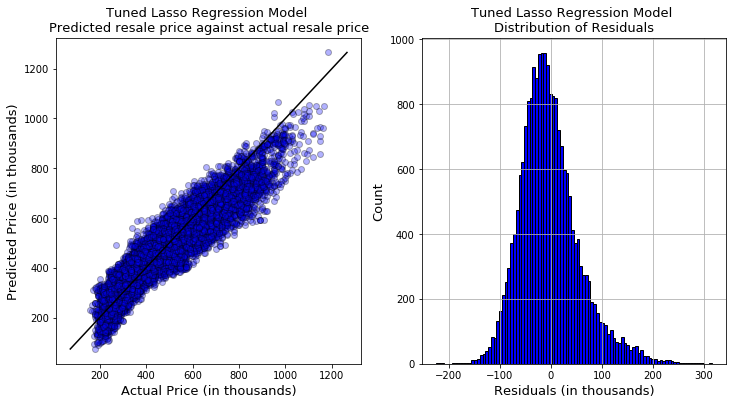

In [73]:
#Check predictions and residuals
pred_real_plots_res(y_test,lasso_cv_predictions,'Tuned Lasso Regression')

In [74]:
#Check the coefficients
lasso_cv_summary.sort_values('abs coef',ascending=False).head(10)

,Features,coef,abs coef
0,floor_area_sqm,94740.271990,94740.271990
1,remaining_lease,45038.269125,45038.269125
5,town_BUKIT MERAH,33238.553181,33238.553181
19,town_QUEENSTOWN,29358.443489,29358.443489
4,town_BISHAN,22776.234597,22776.234597
15,town_KALLANG/WHAMPOA,21359.374841,21359.374841
24,town_TOA PAYOH,20453.689059,20453.689059
25,town_WOODLANDS,-19717.384020,19717.384020
9,town_CHOA CHU KANG,-18929.568345,18929.568345
8,town_CENTRAL AREA,18020.720639,18020.720639


In [75]:
#Add training scores for comparison
add_model_train('Tuned Lasso',lasso_cv_scores)

,model_name,train_r2_mean,train_r2_std,train_RMSE_mean,train_RMSE_std
0,Simple Linear Regression,0.8629,0.0034,52060.0828,2222.5753
1,Lasso Regression,0.8629,0.0034,52060.2227,2223.1655
2,Tuned Lasso,0.8629,0.0032,52066.7178,2267.2341


In [76]:
#Add test scores for comparison
add_model_test('Tuned Lasso',lasso_cv_score, lasso_cv_rmse)

,model_name,test_r2_mean,test_RMSE_mean
0,Simple Linear Regression,0.859178,59115.64
1,Lasso Regression,0.859172,59116.91
2,Tuned Lasso,0.858587,59239.48


## Tuned Ridge

In [77]:
#Search for optimal parameters
ridge_alpha = RidgeCV(alphas=np.logspace(-3,3,100),scoring ='neg_mean_squared_error', cv=10)
ridge_alpha.fit(Xs_train,y_train)

RidgeCV(alphas=array([1.00000e-03, 1.14976e-03, ..., 8.69749e+02, 1.00000e+03]),
    cv=10, fit_intercept=True, gcv_mode=None, normalize=False,
    scoring='neg_mean_squared_error', store_cv_values=False)

In [78]:
#Fit optimal parameters and run cross validation on training set
ridge_reg=Lasso(ridge_alpha.alpha_)
ridge_cv_scores = model_scores_cv(ridge_reg,Xs_train,y_train)

Mean r2 score:  0.8629 ± 0.0034
Mean RMSE score:  52060.1606 ± 2225.4379


In [79]:
#Run the model on the test set
ridge_cv_summary, ridge_cv_score, ridge_cv_rmse, ridge_cv_predictions= model_test_scores(ridge_reg,Xs_train,y_train,Xs_test,y_test,X_train.columns)

Test r2 score:  0.8591428673007158
Test Mean Squared Error:  59122.98


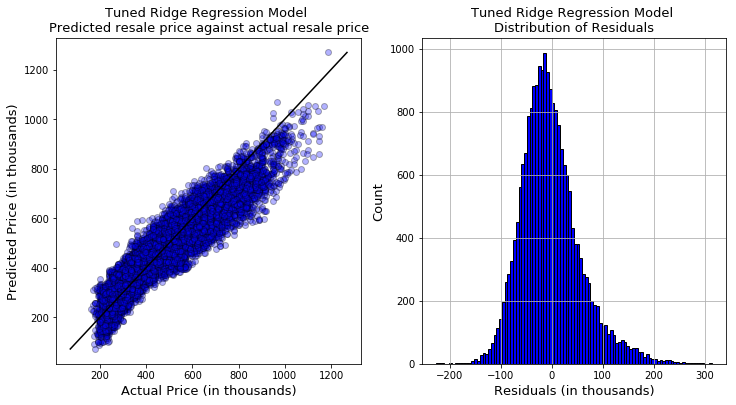

In [80]:
#Check predictions and residuals
pred_real_plots_res(y_test,ridge_cv_predictions,'Tuned Ridge Regression')

In [81]:
#Check the coefficients
ridge_cv_summary.sort_values('abs coef',ascending=False).head(10)

,Features,coef,abs coef
0,floor_area_sqm,94817.325639,94817.325639
1,remaining_lease,45559.962250,45559.962250
5,town_BUKIT MERAH,33401.082941,33401.082941
19,town_QUEENSTOWN,29516.041777,29516.041777
4,town_BISHAN,22916.175974,22916.175974
15,town_KALLANG/WHAMPOA,21537.385917,21537.385917
24,town_TOA PAYOH,20683.348428,20683.348428
25,town_WOODLANDS,-19716.138060,19716.138060
9,town_CHOA CHU KANG,-18948.844870,18948.844870
8,town_CENTRAL AREA,18116.697917,18116.697917


In [82]:
#Add training scores for comparison
add_model_train('Tuned Ridge',ridge_cv_scores)

,model_name,train_r2_mean,train_r2_std,train_RMSE_mean,train_RMSE_std
0,Simple Linear Regression,0.8629,0.0034,52060.0828,2222.5753
1,Lasso Regression,0.8629,0.0034,52060.2227,2223.1655
2,Tuned Lasso,0.8629,0.0032,52066.7178,2267.2341
3,Tuned Ridge,0.8629,0.0034,52060.1606,2225.4379


In [83]:
#Add test scores for comparison
add_model_test('Tuned Ridge',ridge_cv_score, ridge_cv_rmse)

,model_name,test_r2_mean,test_RMSE_mean
0,Simple Linear Regression,0.859178,59115.64
1,Lasso Regression,0.859172,59116.91
2,Tuned Lasso,0.858587,59239.48
3,Tuned Ridge,0.859143,59122.98


## Tuned ElasticNet

In [84]:
#Search for optimal parameters
enet_alpha_ratio = ElasticNetCV(l1_ratio=[0.01,0.1,0.3,0.5,0.7,0.9,0.92,0.95,0.98,0.99],n_alphas=300,cv=10)
enet_alpha_ratio.fit(Xs_train,y_train)

ElasticNetCV(alphas=None, copy_X=True, cv=10, eps=0.001, fit_intercept=True,
       l1_ratio=[0.01, 0.1, 0.3, 0.5, 0.7, 0.9, 0.92, 0.95, 0.98, 0.99],
       max_iter=1000, n_alphas=300, n_jobs=None, normalize=False,
       positive=False, precompute='auto', random_state=None,
       selection='cyclic', tol=0.0001, verbose=0)

In [85]:
print(enet_alpha_ratio.alpha_)
print(enet_alpha_ratio.l1_ratio_)

92.3145487477451
0.99


In [86]:
#Fit optimal parameters and run cross validation on training set
enet_reg=ElasticNet(alpha=enet_alpha_ratio.alpha_, l1_ratio=enet_alpha_ratio.l1_ratio_)
enet_cv_scores = model_scores_cv(enet_reg,Xs_train,y_train)

Mean r2 score:  0.6699 ± 0.0138
Mean RMSE score:  80874.1785 ± 5687.2522


In [87]:
#Run the model on the test set
enet_cv_summary, enet_cv_score, enet_cv_rmse, enet_cv_predictions= model_test_scores(enet_reg,Xs_train,y_train,Xs_test,y_test,X_train.columns)

Test r2 score:  0.6407349251734975
Test Mean Squared Error:  94422.26


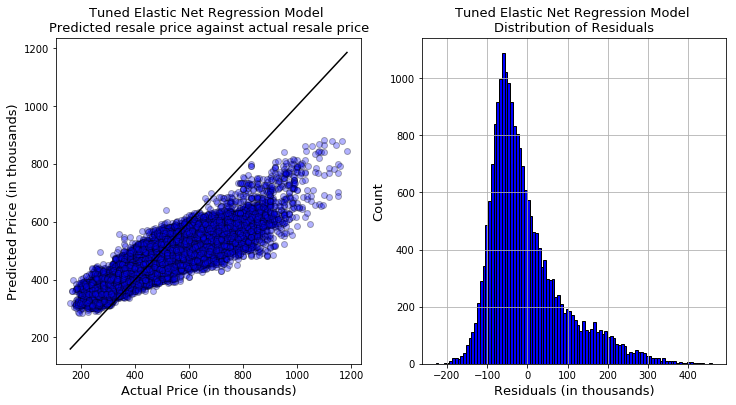

In [88]:
#Check predictions and residuals
pred_real_plots_res(y_test,enet_cv_predictions,'Tuned Elastic Net Regression')

In [89]:
#Add training scores for comparison
add_model_train('Tuned Elastic Net',enet_cv_scores)

,model_name,train_r2_mean,train_r2_std,train_RMSE_mean,train_RMSE_std
0,Simple Linear Regression,0.8629,0.0034,52060.0828,2222.5753
1,Lasso Regression,0.8629,0.0034,52060.2227,2223.1655
2,Tuned Lasso,0.8629,0.0032,52066.7178,2267.2341
3,Tuned Ridge,0.8629,0.0034,52060.1606,2225.4379
4,Tuned Elastic Net,0.6699,0.0138,80874.1785,5687.2522


In [90]:
#Add test scores for comparison
add_model_test('Tuned Elastic Net',enet_cv_score, enet_cv_rmse)

,model_name,test_r2_mean,test_RMSE_mean
0,Simple Linear Regression,0.859178,59115.64
1,Lasso Regression,0.859172,59116.91
2,Tuned Lasso,0.858587,59239.48
3,Tuned Ridge,0.859143,59122.98
4,Tuned Elastic Net,0.640735,94422.26


## Random Forest

In [91]:
from sklearn.ensemble import RandomForestRegressor

In [92]:
rfr = RandomForestRegressor(n_estimators=100,random_state=42)

In [93]:
#Run cross validation on training set
rfr_scores = model_scores_cv(rfr,X_train,y_train)

Mean r2 score:  0.9321 ± 0.0043
Mean RMSE score:  36622.4376 ± 2183.8323


In [94]:
rfr.fit(X_train,y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
           oob_score=False, random_state=42, verbose=0, warm_start=False)

In [95]:
#Retrieve predictions
rfr_predictions = rfr.predict(X_test)

In [96]:
#Score the model
rfr_score = round(r2_score(y_test,rfr_predictions),4)
rfr_rmse = round(np.sqrt(mean_squared_error(y_test,rfr_predictions)),2)

print('Test r2 score: ',rfr_score)
print('Test RMSE: ',rfr_rmse)

Test r2 score:  0.9023
Test RMSE:  49247.11


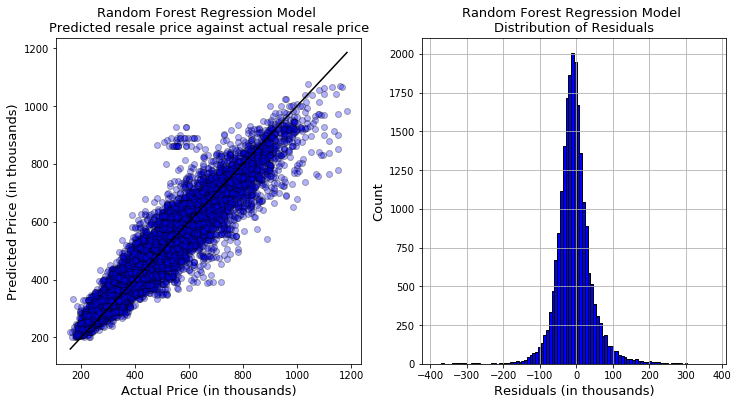

In [97]:
#Check predictions and residuals
pred_real_plots_res(y_test,rfr_predictions,'Random Forest Regression')

In [98]:
rfr_df = pd.DataFrame({'Features':X_train.columns,'coef':rfr.feature_importances_,'abs coef':abs(rfr.feature_importances_)})

In [99]:
#Take a look at the 10 most impactful features
rfr_df.sort_values('abs coef', ascending=False).head(10)

,Features,coef,abs coef
0,floor_area_sqm,0.498911,0.498911
1,remaining_lease,0.142017,0.142017
5,town_BUKIT MERAH,0.054050,0.054050
8,town_CENTRAL AREA,0.036923,0.036923
19,town_QUEENSTOWN,0.035745,0.035745
4,town_BISHAN,0.026834,0.026834
24,town_TOA PAYOH,0.019462,0.019462
15,town_KALLANG/WHAMPOA,0.018591,0.018591
45,flat_model_DBSS,0.015092,0.015092
10,town_CLEMENTI,0.011443,0.011443


In [100]:
#Add training scores for comparison
add_model_train('Random Forest',rfr_scores)

,model_name,train_r2_mean,train_r2_std,train_RMSE_mean,train_RMSE_std
0,Simple Linear Regression,0.8629,0.0034,52060.0828,2222.5753
1,Lasso Regression,0.8629,0.0034,52060.2227,2223.1655
2,Tuned Lasso,0.8629,0.0032,52066.7178,2267.2341
3,Tuned Ridge,0.8629,0.0034,52060.1606,2225.4379
4,Tuned Elastic Net,0.6699,0.0138,80874.1785,5687.2522
5,Random Forest,0.9321,0.0043,36622.4376,2183.8323


In [101]:
#Add test scores for comparison
add_model_test('Random Forest',rfr_score, rfr_rmse)

,model_name,test_r2_mean,test_RMSE_mean
0,Simple Linear Regression,0.859178,59115.64
1,Lasso Regression,0.859172,59116.91
2,Tuned Lasso,0.858587,59239.48
3,Tuned Ridge,0.859143,59122.98
4,Tuned Elastic Net,0.640735,94422.26
5,Random Forest,0.902300,49247.11


<div class="alert alert-block alert-info">
    The shape of residuals show that with these set of features, linear regression isn't suitable as beyond about 600 to 700 thousand (actual price), the predictions are biased towards underpredicting.
    <br>
    <br>
    The spread of erros for Random Forest is far more consistent. On top of that, the RMSE is significantly lower as well.
    <br>
    <br>
    I will try transforming the target variable to see if that better describes the relationship.
</div>

## Log Price

In [102]:
#Search for optimal parameters
lasso_log_alpha = LassoCV(n_alphas=300, cv=10)
lasso_log_alpha.fit(Xs_train,np.log(y_train))

#Fit optimal parameters and run cross validation on training set
lasso_log_reg=Lasso(lasso_log_alpha.alpha_)
lasso_log_cv_scores = model_scores_cv(lasso_reg,Xs_train,np.log(y_train))

Mean r2 score:  -0.0005 ± 0.0003
Mean RMSE score:  0.2952 ± 0.0142


In [103]:
#Fit the full training data
lasso_log_reg.fit(Xs_train,np.log(y_train))

Lasso(alpha=0.0002082465399020493, copy_X=True, fit_intercept=True,
   max_iter=1000, normalize=False, positive=False, precompute=False,
   random_state=None, selection='cyclic', tol=0.0001, warm_start=False)

In [104]:
#Retrieve the predictions
log_predictions = lasso_log_reg.predict(Xs_test)

In [105]:
#Convert back to actual dollars to make sense of the findings
np.sqrt(mean_squared_error(y_test,np.exp(log_predictions)))

56607.50260561813

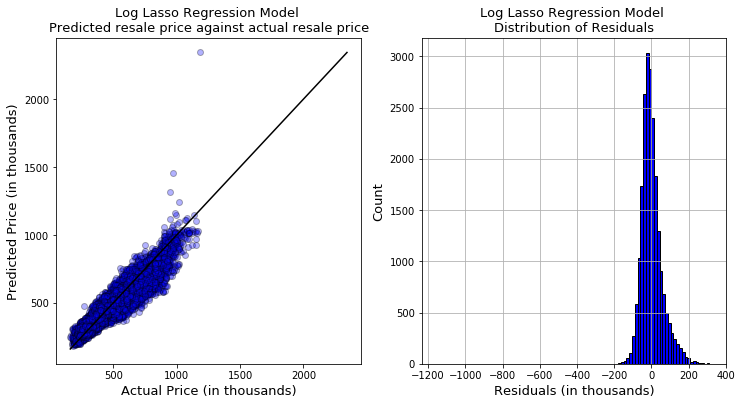

In [106]:
pred_real_plots_res(y_test,np.exp(log_predictions),'Log Lasso Regression')

In [107]:
#Check the coefficients
pd.DataFrame({'Features':X_train.columns,'coef':lasso_reg.coef_,'abs coef':abs(lasso_reg.coef_)}).sort_values('abs coef',ascending=False).head(10)

,Features,coef,abs coef
0,floor_area_sqm,94740.271990,94740.271990
1,remaining_lease,45038.269125,45038.269125
5,town_BUKIT MERAH,33238.553181,33238.553181
19,town_QUEENSTOWN,29358.443489,29358.443489
4,town_BISHAN,22776.234597,22776.234597
15,town_KALLANG/WHAMPOA,21359.374841,21359.374841
24,town_TOA PAYOH,20453.689059,20453.689059
25,town_WOODLANDS,-19717.384020,19717.384020
9,town_CHOA CHU KANG,-18929.568345,18929.568345
8,town_CENTRAL AREA,18020.720639,18020.720639


<div class="alert alert-block alert-danger">
    Transforming the target variable didn't help all that much and also introduced an extremely erroneous prediction. Perhaps the inclusion of addition features would help.
</div>



## Preliminary Modelling Conclusion

From the inital features, much of the flat's price is explained, as can be seen from the relatively high R-squared scores, however, the RMSE is still rather high and would not be very assuring for users. RMSE was selected as it penalises larger errors more heavily. Looking at the mean sale price of \\$440k and the median sale price of \\$400k, the target will be to reach an RMSE under 10% of the median sale price (since that is stricter than mean.

In order to improve the models, I will move on to feature engineering and using geodata to help define the value of a house, since amenities are also important to people's decision in choosing a flat.